# Import the Essential Libraries and downloading the dataset


In [18]:
# Required imports
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import cv2
import os
import glob
from tqdm import tqdm
import scipy.io as sio
from sklearn.metrics import precision_recall_curve, average_precision_score

# Check if GPU is available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Download dataset 
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
!tar -xzf BSR_bsds500.tgz

# Define paths
data_dir = 'BSR/BSDS500/data'
images_dir = os.path.join(data_dir, 'images')
gt_dir = os.path.join(data_dir, 'groundTruth')


Using device: cuda
--2025-04-06 08:48:41--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)... 128.32.244.190
Connecting to www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 70763455 (67M) [application/x-tar]
Saving to: ‘BSR_bsds500.tgz.1’

BSR_bsds500.tgz.1   100%[===================>]  67.48M  31.3MB/s    in 2.2s    

2025-04-06 08:48:44 (31.3 MB/s) - ‘BSR_bsds500.tgz.1’ saved [70763455/70763455]



# Defining the BSDS500Dataset class for training our CNN model

In [19]:
# Define BSDS500Dataset class with resizing 
class BSDS500Dataset(Dataset):
    def __init__(self, split='train', transform=None, target_size=(320, 320)):
        self.split = split
        self.transform = transform
        self.target_size = target_size  # Width, Height
        self.img_paths = glob.glob(os.path.join(images_dir, split, '*.jpg'))
        self.gt_paths = [os.path.join(gt_dir, split, os.path.basename(p).split('.')[0] + '.mat') 
                         for p in self.img_paths]
    
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        # Load image
        img_path = self.img_paths[idx]
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Resize image to target size
        img = cv2.resize(img, self.target_size)
        
        # Load ground truth edges
        gt_path = self.gt_paths[idx]
        gt_data = sio.loadmat(gt_path)
        
        # Get ground truth boundaries and resize them
        num_annotators = gt_data['groundTruth'].shape[1]
        gt_edges = np.zeros((self.target_size[1], self.target_size[0]), dtype=np.float32)
        
        for i in range(num_annotators):
            boundaries = gt_data['groundTruth'][0, i]['Boundaries'][0, 0]
            # Resize boundaries to match target size
            boundaries = cv2.resize(boundaries.astype(np.float32), self.target_size)
            gt_edges += boundaries
        
        gt_edges = (gt_edges > 0).astype(np.float32)  # Binarize
        
        # Apply transformations
        if self.transform:
            img = self.transform(img)
            
        # Convert ground truth to tensor
        gt_edges = torch.from_numpy(gt_edges).float().unsqueeze(0)  # Add channel dimension
        
        return img, gt_edges

# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets and dataloaders with fixed size
train_dataset = BSDS500Dataset(split='train', transform=transform, target_size=(320, 320))
val_dataset = BSDS500Dataset(split='val', transform=transform, target_size=(320, 320))

batch_size = 6
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# Defining our simple CNN Model

In [20]:
# Define the Simple CNN Model 
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        # First conv layer: 3 input channels (RGB), 8 output channels, 3x3 kernel
        self.conv1 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU(inplace=True)
        
        # Second conv layer: 8 input channels, 16 output channels, 3x3 kernel
        self.conv2 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU(inplace=True)
        
        # Third conv layer: 16 input channels, 1 output channel (edge map), 3x3 kernel
        self.conv3 = nn.Conv2d(16, 1, kernel_size=3, padding=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu1(self.conv1(x))
        x = self.relu2(self.conv2(x))
        x = self.sigmoid(self.conv3(x))
        return x


# Implementing class-balanced cross-entropy loss as mentioned in the HED paper

In [21]:
class ClassBalancedCELoss(nn.Module):
    def __init__(self, beta=0.5):
        super(ClassBalancedCELoss, self).__init__()
        self.beta = beta  # Weight for positive examples (edges)
        self.epsilon = 1e-6  # Small constant to avoid log(0)
    
    def forward(self, pred, target):
        # Calculate weights for class balance
        beta_balance = torch.zeros_like(target)
        beta_balance[target > 0] = self.beta
        beta_balance[target <= 0] = 1.0 - self.beta
        
        # Binary cross-entropy terms
        loss = -beta_balance * (
            target * torch.log(pred + self.epsilon) + 
            (1.0 - target) * torch.log(1.0 - pred + self.epsilon)
        )
        
        return torch.mean(loss)

# Initialize model, loss function, and optimizer

In [22]:
model = SimpleCNN().to(device)
criterion = ClassBalancedCELoss(beta=0.5)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training function

In [6]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=100):
    train_losses = []
    val_losses = []
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        
        for inputs, targets in tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Training'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Zero the parameter gradients
            optimizer.zero_grad()
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            
            # Backward pass and optimize
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
        
        train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(train_loss)
        
        # Validation phase
        model.eval()
        running_loss = 0.0
        
        with torch.no_grad():
            for inputs, targets in tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} - Validation'):
                inputs, targets = inputs.to(device), targets.to(device)
                
                # Forward pass
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                
                running_loss += loss.item() * inputs.size(0)
        
        val_loss = running_loss / len(val_loader.dataset)
        val_losses.append(val_loss)
        
        print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    
    return train_losses, val_losses



# Function to evaluate edge detection results

In [7]:
def evaluate_model(model, dataloader, threshold=0.5):
    model.eval()
    all_precision = []
    all_recall = []
    all_ap = []
    
    with torch.no_grad():
        for inputs, targets in tqdm(dataloader, desc='Evaluating'):
            inputs, targets = inputs.to(device), targets.to(device)
            
            # Forward pass
            outputs = model(inputs)
            
            # Calculate metrics for each image in batch
            for i in range(inputs.size(0)):
                pred = outputs[i, 0].cpu().numpy()
                target = targets[i, 0].cpu().numpy()
                
                # Calculate precision-recall curve
                precision, recall, _ = precision_recall_curve(target.flatten(), pred.flatten())
                ap = average_precision_score(target.flatten(), pred.flatten())
                
                all_precision.append(precision)
                all_recall.append(recall)
                all_ap.append(ap)
    
    avg_ap = np.mean(all_ap)
    return all_precision, all_recall, all_ap, avg_ap

# Function to visualize edge detection results

In [8]:
def visualize_results(model, dataloader, num_samples=5, threshold=0.5):
    model.eval()
    
    # Get some sample images
    dataiter = iter(dataloader)
    images, targets = next(dataiter)
    
    # Limit to requested number of samples
    images = images[:num_samples]
    targets = targets[:num_samples]
    
    # Generate predictions
    with torch.no_grad():
        outputs = model(images.to(device))
        binary_outputs = (outputs > threshold).float()
    
    # Plot results
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    for i in range(num_samples):
        # Original image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        # Ground truth
        gt = targets[i, 0].cpu().numpy()
        
        # Prediction
        pred = binary_outputs[i, 0].cpu().numpy()
        
        # Plot
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred, cmap='gray')
        axes[i, 2].set_title(f'CNN Prediction (th={threshold})')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()
    


# Main execution

Epoch 1/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.66it/s]


Epoch 1/100, Train Loss: 0.2359, Val Loss: 0.2034


Epoch 2/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.95it/s]


Epoch 2/100, Train Loss: 0.1940, Val Loss: 0.1932


Epoch 3/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.13it/s]


Epoch 3/100, Train Loss: 0.1863, Val Loss: 0.1869


Epoch 4/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 18.87it/s]


Epoch 4/100, Train Loss: 0.1794, Val Loss: 0.1816


Epoch 5/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.64it/s]


Epoch 5/100, Train Loss: 0.1766, Val Loss: 0.1803


Epoch 6/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.34it/s]


Epoch 6/100, Train Loss: 0.1757, Val Loss: 0.1796


Epoch 7/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.32it/s]


Epoch 7/100, Train Loss: 0.1746, Val Loss: 0.1787


Epoch 8/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.08it/s]


Epoch 8/100, Train Loss: 0.1738, Val Loss: 0.1778


Epoch 9/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.73it/s]


Epoch 9/100, Train Loss: 0.1730, Val Loss: 0.1769


Epoch 10/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.12it/s]


Epoch 10/100, Train Loss: 0.1716, Val Loss: 0.1752


Epoch 11/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.79it/s]


Epoch 11/100, Train Loss: 0.1699, Val Loss: 0.1733


Epoch 12/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.57it/s]


Epoch 12/100, Train Loss: 0.1680, Val Loss: 0.1719


Epoch 13/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.68it/s]


Epoch 13/100, Train Loss: 0.1663, Val Loss: 0.1689


Epoch 14/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.73it/s]


Epoch 14/100, Train Loss: 0.1638, Val Loss: 0.1675


Epoch 15/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.90it/s]


Epoch 15/100, Train Loss: 0.1618, Val Loss: 0.1662


Epoch 16/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 18.47it/s]


Epoch 16/100, Train Loss: 0.1609, Val Loss: 0.1648


Epoch 17/100 - Validation: 100%|██████████| 17/17 [00:01<00:00, 16.03it/s]


Epoch 17/100, Train Loss: 0.1595, Val Loss: 0.1640


Epoch 18/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.52it/s]


Epoch 18/100, Train Loss: 0.1590, Val Loss: 0.1636


Epoch 19/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.21it/s]


Epoch 19/100, Train Loss: 0.1579, Val Loss: 0.1628


Epoch 20/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.30it/s]


Epoch 20/100, Train Loss: 0.1576, Val Loss: 0.1620


Epoch 21/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.39it/s]


Epoch 21/100, Train Loss: 0.1563, Val Loss: 0.1618


Epoch 22/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.45it/s]


Epoch 22/100, Train Loss: 0.1564, Val Loss: 0.1616


Epoch 23/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.85it/s]


Epoch 23/100, Train Loss: 0.1559, Val Loss: 0.1616


Epoch 24/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.64it/s]


Epoch 24/100, Train Loss: 0.1557, Val Loss: 0.1613


Epoch 25/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.99it/s]


Epoch 25/100, Train Loss: 0.1550, Val Loss: 0.1607


Epoch 26/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.61it/s]


Epoch 26/100, Train Loss: 0.1548, Val Loss: 0.1609


Epoch 27/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.10it/s]


Epoch 27/100, Train Loss: 0.1552, Val Loss: 0.1600


Epoch 28/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.93it/s]


Epoch 28/100, Train Loss: 0.1547, Val Loss: 0.1644


Epoch 29/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.40it/s]


Epoch 29/100, Train Loss: 0.1546, Val Loss: 0.1601


Epoch 30/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 18.08it/s]


Epoch 30/100, Train Loss: 0.1540, Val Loss: 0.1599


Epoch 31/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.32it/s]


Epoch 31/100, Train Loss: 0.1535, Val Loss: 0.1600


Epoch 32/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.11it/s]


Epoch 32/100, Train Loss: 0.1529, Val Loss: 0.1592


Epoch 33/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.64it/s]


Epoch 33/100, Train Loss: 0.1531, Val Loss: 0.1591


Epoch 34/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.58it/s]


Epoch 34/100, Train Loss: 0.1537, Val Loss: 0.1594


Epoch 35/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.05it/s]


Epoch 35/100, Train Loss: 0.1539, Val Loss: 0.1592


Epoch 36/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.54it/s]


Epoch 36/100, Train Loss: 0.1531, Val Loss: 0.1587


Epoch 37/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.18it/s]


Epoch 37/100, Train Loss: 0.1522, Val Loss: 0.1581


Epoch 38/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.16it/s]


Epoch 38/100, Train Loss: 0.1521, Val Loss: 0.1585


Epoch 39/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.22it/s]


Epoch 39/100, Train Loss: 0.1517, Val Loss: 0.1589


Epoch 40/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.10it/s]


Epoch 40/100, Train Loss: 0.1522, Val Loss: 0.1582


Epoch 41/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.24it/s]


Epoch 41/100, Train Loss: 0.1516, Val Loss: 0.1583


Epoch 42/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 17.32it/s]


Epoch 42/100, Train Loss: 0.1519, Val Loss: 0.1579


Epoch 43/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.10it/s]


Epoch 43/100, Train Loss: 0.1511, Val Loss: 0.1568


Epoch 44/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.11it/s]


Epoch 44/100, Train Loss: 0.1512, Val Loss: 0.1579


Epoch 45/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.27it/s]


Epoch 45/100, Train Loss: 0.1504, Val Loss: 0.1566


Epoch 46/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.90it/s]


Epoch 46/100, Train Loss: 0.1503, Val Loss: 0.1562


Epoch 47/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.84it/s]


Epoch 47/100, Train Loss: 0.1499, Val Loss: 0.1560


Epoch 48/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.58it/s]


Epoch 48/100, Train Loss: 0.1496, Val Loss: 0.1562


Epoch 49/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.71it/s]


Epoch 49/100, Train Loss: 0.1498, Val Loss: 0.1563


Epoch 50/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.72it/s]


Epoch 50/100, Train Loss: 0.1495, Val Loss: 0.1554


Epoch 51/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.05it/s]


Epoch 51/100, Train Loss: 0.1497, Val Loss: 0.1572


Epoch 52/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.24it/s]


Epoch 52/100, Train Loss: 0.1488, Val Loss: 0.1551


Epoch 53/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.31it/s]


Epoch 53/100, Train Loss: 0.1487, Val Loss: 0.1555


Epoch 54/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.59it/s]


Epoch 54/100, Train Loss: 0.1493, Val Loss: 0.1589


Epoch 55/100 - Validation: 100%|██████████| 17/17 [00:01<00:00, 15.89it/s]


Epoch 55/100, Train Loss: 0.1488, Val Loss: 0.1569


Epoch 56/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.60it/s]


Epoch 56/100, Train Loss: 0.1500, Val Loss: 0.1557


Epoch 57/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.82it/s]


Epoch 57/100, Train Loss: 0.1487, Val Loss: 0.1559


Epoch 58/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.53it/s]


Epoch 58/100, Train Loss: 0.1484, Val Loss: 0.1556


Epoch 59/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.13it/s]


Epoch 59/100, Train Loss: 0.1483, Val Loss: 0.1550


Epoch 60/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.78it/s]


Epoch 60/100, Train Loss: 0.1488, Val Loss: 0.1547


Epoch 61/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.38it/s]


Epoch 61/100, Train Loss: 0.1478, Val Loss: 0.1545


Epoch 62/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.07it/s]


Epoch 62/100, Train Loss: 0.1482, Val Loss: 0.1549


Epoch 63/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.63it/s]


Epoch 63/100, Train Loss: 0.1477, Val Loss: 0.1547


Epoch 64/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.77it/s]


Epoch 64/100, Train Loss: 0.1479, Val Loss: 0.1544


Epoch 65/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.30it/s]


Epoch 65/100, Train Loss: 0.1474, Val Loss: 0.1552


Epoch 66/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.17it/s]


Epoch 66/100, Train Loss: 0.1474, Val Loss: 0.1553


Epoch 67/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.16it/s]


Epoch 67/100, Train Loss: 0.1478, Val Loss: 0.1571


Epoch 68/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.40it/s]


Epoch 68/100, Train Loss: 0.1486, Val Loss: 0.1557


Epoch 69/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.20it/s]


Epoch 69/100, Train Loss: 0.1477, Val Loss: 0.1540


Epoch 70/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.17it/s]


Epoch 70/100, Train Loss: 0.1469, Val Loss: 0.1545


Epoch 71/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 18.56it/s]


Epoch 71/100, Train Loss: 0.1478, Val Loss: 0.1542


Epoch 72/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.64it/s]


Epoch 72/100, Train Loss: 0.1474, Val Loss: 0.1541


Epoch 73/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.09it/s]


Epoch 73/100, Train Loss: 0.1473, Val Loss: 0.1537


Epoch 74/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.63it/s]


Epoch 74/100, Train Loss: 0.1468, Val Loss: 0.1539


Epoch 75/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.70it/s]


Epoch 75/100, Train Loss: 0.1467, Val Loss: 0.1534


Epoch 76/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.13it/s]


Epoch 76/100, Train Loss: 0.1474, Val Loss: 0.1544


Epoch 77/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.62it/s]


Epoch 77/100, Train Loss: 0.1476, Val Loss: 0.1538


Epoch 78/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.31it/s]


Epoch 78/100, Train Loss: 0.1473, Val Loss: 0.1540


Epoch 79/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.00it/s]


Epoch 79/100, Train Loss: 0.1476, Val Loss: 0.1538


Epoch 80/100 - Validation: 100%|██████████| 17/17 [00:01<00:00, 16.37it/s]


Epoch 80/100, Train Loss: 0.1475, Val Loss: 0.1556


Epoch 81/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.33it/s]


Epoch 81/100, Train Loss: 0.1467, Val Loss: 0.1539


Epoch 82/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.22it/s]


Epoch 82/100, Train Loss: 0.1464, Val Loss: 0.1541


Epoch 83/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.30it/s]


Epoch 83/100, Train Loss: 0.1464, Val Loss: 0.1536


Epoch 84/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.64it/s]


Epoch 84/100, Train Loss: 0.1476, Val Loss: 0.1547


Epoch 85/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.81it/s]


Epoch 85/100, Train Loss: 0.1471, Val Loss: 0.1564


Epoch 86/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.28it/s]


Epoch 86/100, Train Loss: 0.1470, Val Loss: 0.1545


Epoch 87/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.15it/s]


Epoch 87/100, Train Loss: 0.1465, Val Loss: 0.1540


Epoch 88/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.35it/s]


Epoch 88/100, Train Loss: 0.1465, Val Loss: 0.1535


Epoch 89/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.40it/s]


Epoch 89/100, Train Loss: 0.1472, Val Loss: 0.1543


Epoch 90/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.63it/s]


Epoch 90/100, Train Loss: 0.1467, Val Loss: 0.1539


Epoch 91/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.46it/s]


Epoch 91/100, Train Loss: 0.1468, Val Loss: 0.1536


Epoch 92/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.47it/s]


Epoch 92/100, Train Loss: 0.1463, Val Loss: 0.1533


Epoch 93/100 - Validation: 100%|██████████| 17/17 [00:01<00:00, 16.87it/s]


Epoch 93/100, Train Loss: 0.1456, Val Loss: 0.1533


Epoch 94/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.90it/s]


Epoch 94/100, Train Loss: 0.1470, Val Loss: 0.1530


Epoch 95/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.89it/s]


Epoch 95/100, Train Loss: 0.1458, Val Loss: 0.1534


Epoch 96/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.40it/s]


Epoch 96/100, Train Loss: 0.1461, Val Loss: 0.1532


Epoch 97/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.94it/s]


Epoch 97/100, Train Loss: 0.1469, Val Loss: 0.1536


Epoch 98/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 19.93it/s]


Epoch 98/100, Train Loss: 0.1467, Val Loss: 0.1542


Epoch 99/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.56it/s]


Epoch 99/100, Train Loss: 0.1457, Val Loss: 0.1530


Epoch 100/100 - Validation: 100%|██████████| 17/17 [00:00<00:00, 20.09it/s]


Epoch 100/100, Train Loss: 0.1457, Val Loss: 0.1530


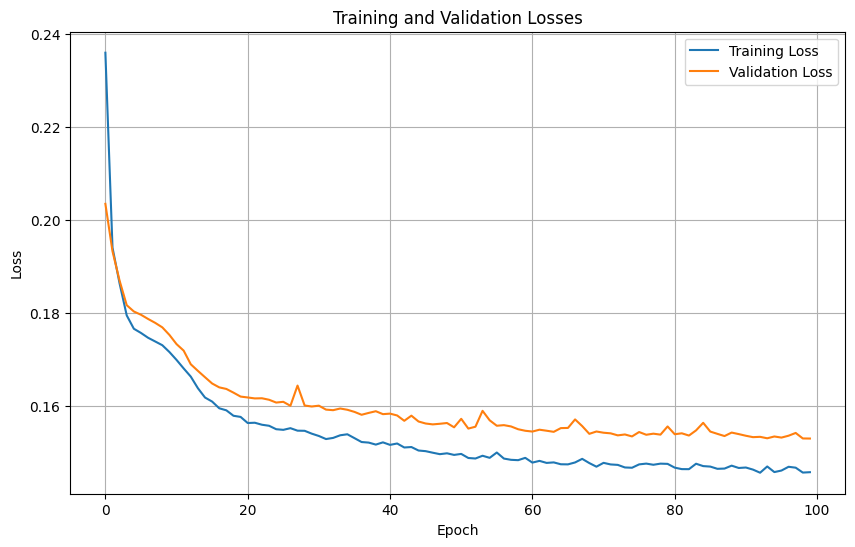

Evaluating: 100%|██████████| 17/17 [00:05<00:00,  3.21it/s]

Average Precision on validation set: 0.3785


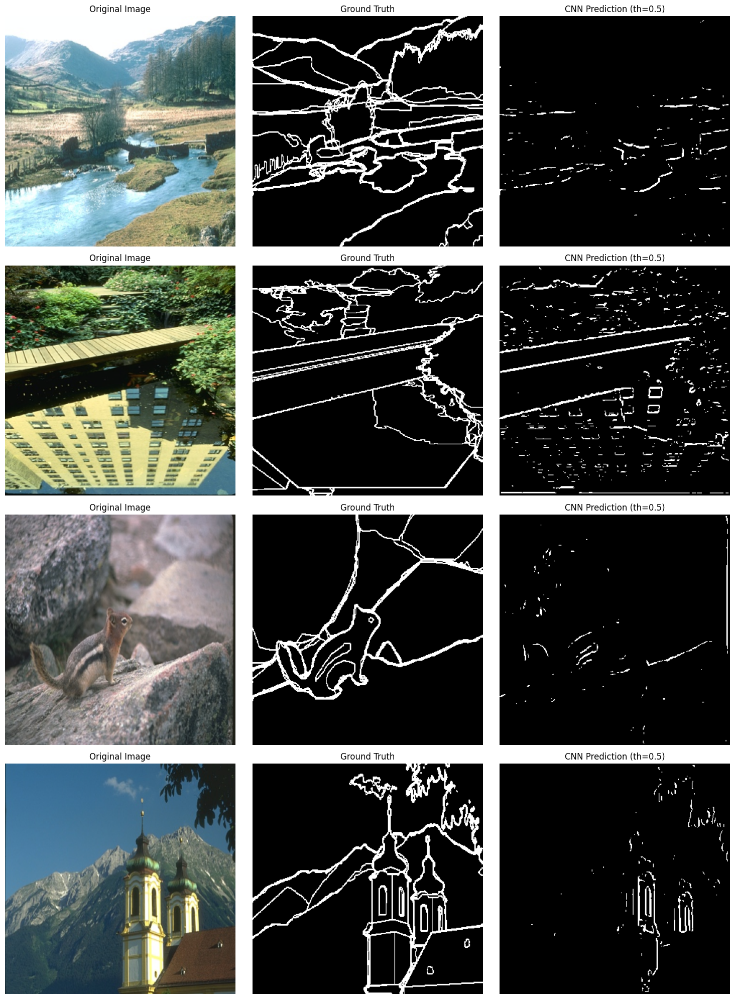

Model saved.


In [9]:

def main():
    # Train the model
    train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=100)
    
    # Plot training and validation losses
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Evaluate the model
    _, _, _, avg_ap = evaluate_model(model, val_loader)
    print(f"Average Precision on validation set: {avg_ap:.4f}")
    
    # Visualize results
    visualize_results(model, val_loader, num_samples=4)
    
    # Save the model
    torch.save(model.state_dict(), 'simple_cnn_edge_detector.pth')
    print("Model saved.")

if __name__ == "__main__":
    main()


# Let's see how results improve or not for different thresholds

<ipython-input-10-840d7088aba5>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/kaggle/working/simple_cnn_edge_detector.pth'))


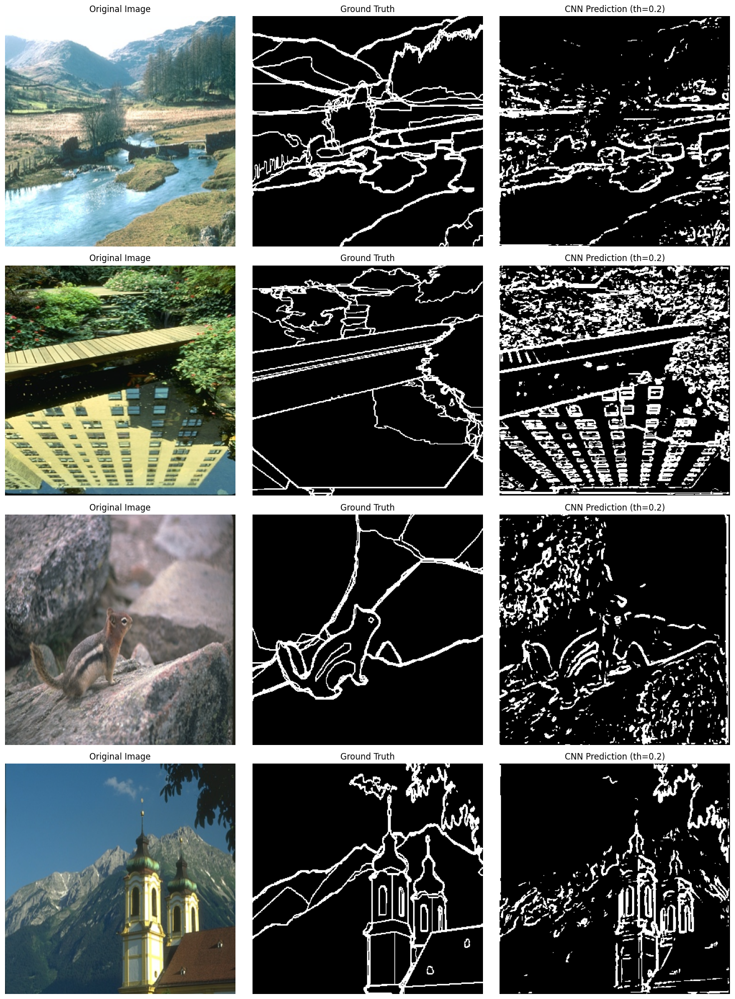

In [10]:
# initializing your model
model = SimpleCNN().to(device)

# Then load the state dictionary
model.load_state_dict(torch.load('/kaggle/working/simple_cnn_edge_detector.pth'))


visualize_results(model, val_loader, num_samples=4, threshold=0.2)


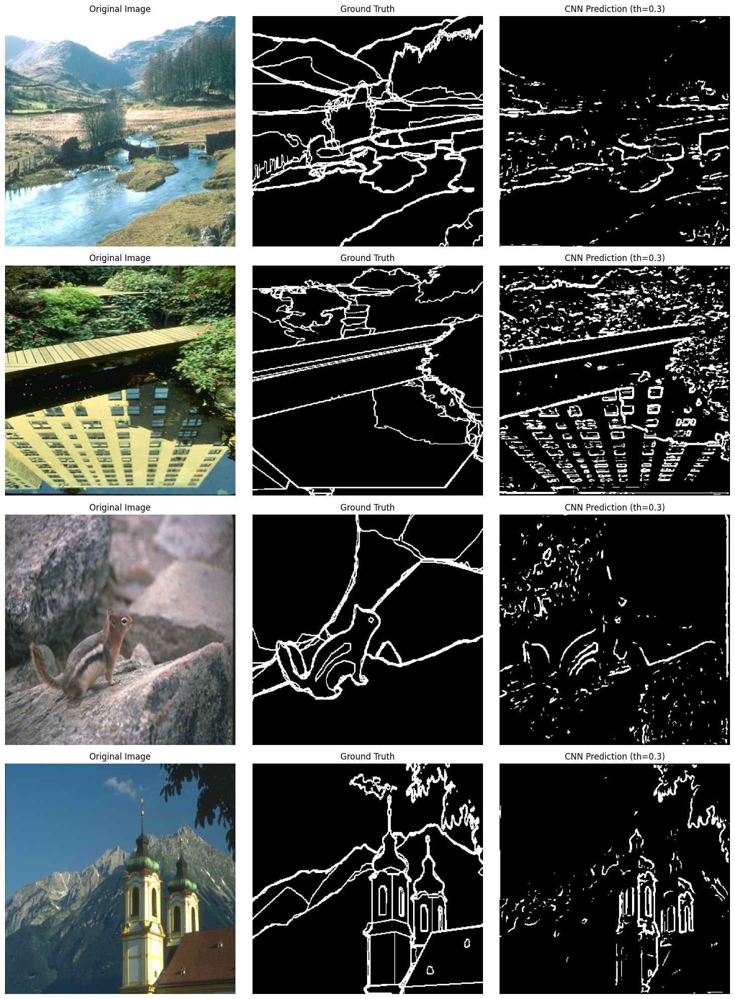

In [11]:
visualize_results(model, val_loader, num_samples=4, threshold=0.3)

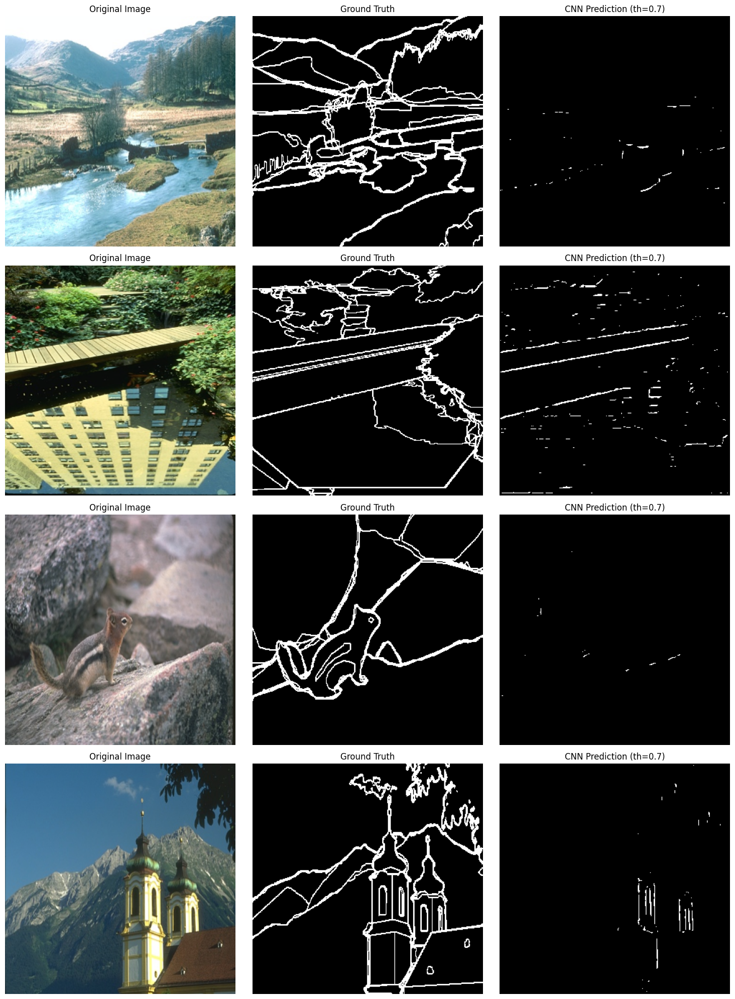

In [12]:
visualize_results(model, val_loader, num_samples=4, threshold=0.7)

In [13]:
def visualize_threshold_difference(model, dataloader, num_samples=4, thresholds=[0.3, 0.5, 0.7]):
    model.eval()
    
    # Get some sample images
    dataiter = iter(dataloader)
    images, targets = next(dataiter)
    
    # Limit to requested number of samples
    images = images[:num_samples]
    targets = targets[:num_samples]
    
    # Generate predictions
    with torch.no_grad():
        outputs = model(images.to(device))
    
    # Create a figure with more columns to accommodate multiple thresholds
    fig, axes = plt.subplots(num_samples, 2 + len(thresholds), figsize=(5*(2 + len(thresholds)), 5*num_samples))

    for i in range(num_samples):
        # Original image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        # Ground truth
        gt = targets[i, 0].cpu().numpy()
        
        # Plot original and ground truth
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        # Plot predictions with different thresholds
        for j, threshold in enumerate(thresholds):
            binary_output = (outputs[i, 0].cpu() > threshold).float().numpy()
            axes[i, j+2].imshow(binary_output, cmap='gray')
            axes[i, j+2].set_title(f'Threshold={threshold}')
            axes[i, j+2].axis('off')

    plt.tight_layout()
    plt.show()


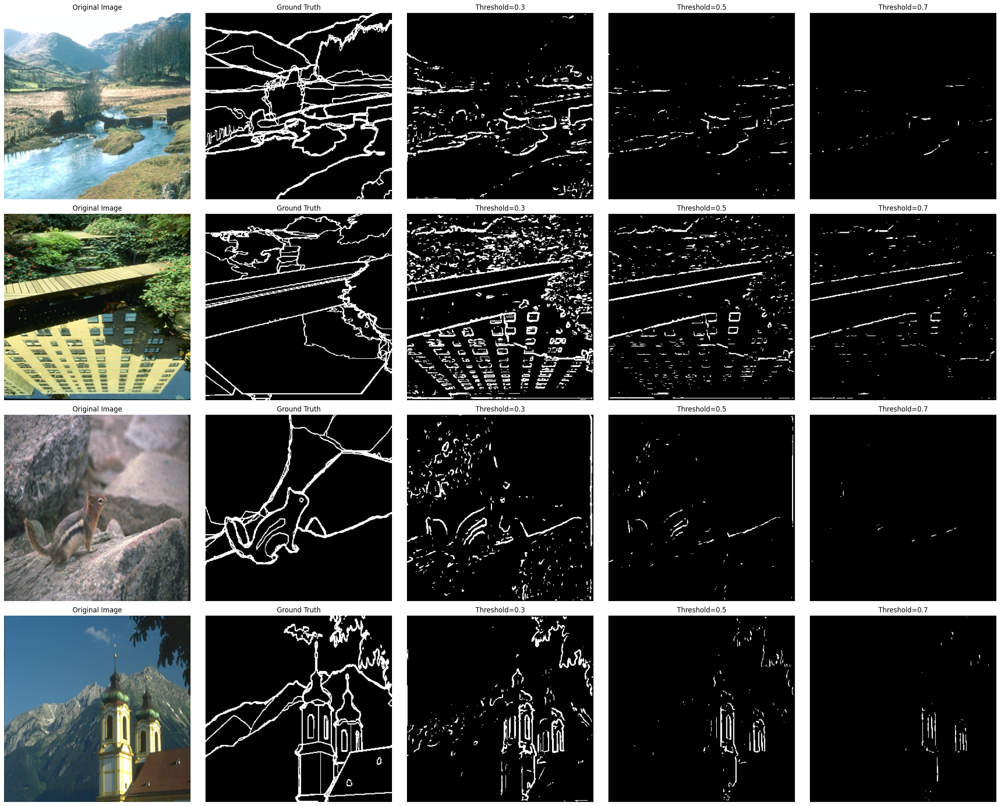

In [14]:
visualize_threshold_difference(model, val_loader, num_samples=4, thresholds=[0.3, 0.5, 0.7])


## Training Process and Performance

The model was successfully trained for 100 epochs with the following architecture:

- 3 convolutional layers with kernel size 3 and padding 1
- 8 filters in the first hidden layer
- 16 filters in the second hidden layer
- ReLU activation in hidden layers
- Sigmoid activation in the output layer

The training showed consistent improvement with the loss decreasing from approximately 0.26 at the beginning to around 0.145 by the end of training. The validation loss similarly decreased from about 0.21 to around 0.15, indicating good generalization.

## Ground Truth vs. Predictions Comparison

The visualizations show that the model successfully learned to detect the most prominent edges in the images. When comparing the ground truth with the model's predictions:

1. **Major Edge Detection**: The model captures the major structural boundaries in images, similar to those in the ground truth.
2. **Detail Loss**: The model tends to miss some of the finer details present in the ground truth. The predicted edges are sometimes thicker and less precise than the ground truth edges.
3. **Noise Suppression**: The model effectively suppresses noise and irrelevant texture details that aren't marked as edges in the ground truth.

## Threshold Value and Its Impact

The threshold value (default 0.5) plays a crucial role in determining the final binary edge map:

1. **Threshold Effect**: The threshold value determines which pixels in the prediction are classified as edges (values above threshold) and which are classified as non-edges (values below threshold).
2. **Trade-off**: Lower threshold values (e.g., 0.3, 0.2,etc) result in:
    - Higher recall (more edges detected)
    - More false positives (noise or texture detected as edges)
    - Thicker, more connected edge lines
3. **Higher thresholds** (e.g., 0.7) result in:
    - Higher precision (edges that are detected are more likely to be true edges)
    - More false negatives (some true edges missed)
    - Thinner, potentially disconnected edge lines
4. **Optimal Value**: The default threshold of 0.5 provides a reasonable balance between detecting important edges and avoiding noise, but the optimal threshold may vary depending on the specific application requirements.

## Overall Observations

1. **Learning Capability**: Despite its simplicity, the 3-layer CNN demonstrates the ability to learn meaningful edge patterns from the training data.
2. **Generalization**: The small gap between training and validation loss indicates good generalization to unseen data.
3. **Average Precision**: The model achieved an average precision of 0.379 on the validation set, which is reasonable for such a simple architecture.
4. **Semantic Understanding**: The CNN shows some ability to distinguish between semantically important edges and texture variations, though not as effectively as more complex architectures would.
5. **Limitations**: The model struggles with fine details and precise edge localization, which is expected given the simplicity of the architecture.

In conclusion, the simple CNN provides a solid baseline for edge detection, capturing the most salient edges in images while demonstrating the fundamental capability of neural networks to learn edge detection from data. The threshold value provides a tunable parameter to adjust the trade-off between detecting more edges (lower threshold) versus having higher confidence in the detected edges (higher threshold).

# Bonus:
## Trying different hyperparameters to check for improvement in model performance

In [27]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from sklearn.metrics import average_precision_score, precision_recall_curve
from tqdm import tqdm
import copy
import os
import glob
import cv2
import scipy.io as sio

# Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Define the CNN Model
class ConfigurableCNN(nn.Module):
    def __init__(self, layers=3, filters=None, kernel_size=3, use_batch_norm=False):
        super(ConfigurableCNN, self).__init__()
        
        if filters is None:
            filters = [8, 16]
        
        self.layers = nn.ModuleList()
        in_channels = 3
        
        # Hidden layers
        for i in range(layers-1):
            out_channels = filters[i] if i < len(filters) else filters[-1]
            self.layers.append(nn.Conv2d(in_channels, out_channels, kernel_size, padding=kernel_size//2))
            if use_batch_norm:
                self.layers.append(nn.BatchNorm2d(out_channels))
            self.layers.append(nn.ReLU(inplace=True))
            in_channels = out_channels
        
        # Output layer
        self.final_conv = nn.Conv2d(in_channels, 1, kernel_size, padding=kernel_size//2)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x = self.sigmoid(self.final_conv(x))
        return x


# Training function with tqdm
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    best_val_ap = 0
    model.train()
    
    for epoch in range(num_epochs):
        # Training
        model.train()
        train_loop = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Train]')
        for inputs, targets in train_loop:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_loop.set_postfix(loss=loss.item())

        # Validation
        model.eval()
        all_preds = []
        all_targets = []
        val_loop = tqdm(val_loader, desc=f'Epoch {epoch+1}/{num_epochs} [Val]')
        with torch.no_grad():
            for inputs, targets in val_loop:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                
                all_preds.append(outputs.squeeze(1).cpu().numpy().reshape(-1))
                all_targets.append(targets.squeeze(1).cpu().numpy().reshape(-1))
        
        # Calculate AP
        avg_ap = average_precision_score(np.concatenate(all_targets), np.concatenate(all_preds))
        if avg_ap > best_val_ap:
            best_val_ap = avg_ap
            
    return best_val_ap

# Main execution
if __name__ == "__main__":
    # Define transforms
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    # Create datasets and dataloaders
    train_dataset = BSDS500Dataset(split='train', transform=transform)
    val_dataset = BSDS500Dataset(split='val', transform=transform)
    
    batch_size = 6
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    # Hyperparameter search space
    learning_rates = [1e-4, 3e-4, 1e-3, 3e-3]
    weight_decays = [0, 1e-4, 1e-3]
    best_ap = 0
    best_params = {}
    
    # Grid search
    print("Starting grid search...")
    for lr in learning_rates:
        for wd in weight_decays:
            print(f"\nTesting lr={lr:.0e}, wd={wd:.0e}")
            
            model = ConfigurableCNN().to(device)
            optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
            
            avg_ap = train_model(model, train_loader, val_loader, ClassBalancedCELoss(beta=0.5), optimizer)
            
            if avg_ap > best_ap:
                best_ap = avg_ap
                best_params = {'lr': lr, 'wd': wd}
            
            print(f"Validation AP: {avg_ap:.4f}")

    # Final training with best parameters
    print("\nTraining final model...")
    final_model = ConfigurableCNN().to(device)
    optimizer = optim.Adam(final_model.parameters(), lr=best_params['lr'], weight_decay=best_params['wd'])
    
    best_model = None
    best_ap = 0
    for epoch in range(10):
        # Full training loop with validation
        train_model(final_model, train_loader, val_loader, ClassBalancedCELoss(beta=0.5), optimizer, num_epochs=1)
        
        # Evaluate
        val_ap = evaluate_model(final_model, val_loader)
        
        # Save best checkpoint
        if val_ap > best_ap:
            best_ap = val_ap
            best_model = copy.deepcopy(final_model.state_dict())

    # Save best model
    torch.save(best_model, 'best_cnn_edge_detector.pth')
    print("Model saved.")
    
    # Visualize results
    visualize_results(final_model, val_loader)

Using device: cuda
Starting grid search...

Testing lr=1e-04, wd=0e+00


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.73it/s]


Validation AP: 0.1310

Testing lr=1e-04, wd=1e-04


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 12.70it/s]


Validation AP: 0.1120

Testing lr=1e-04, wd=1e-03


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 14.19it/s]


Validation AP: 0.1415

Testing lr=3e-04, wd=0e+00


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.58it/s]


Validation AP: 0.1457

Testing lr=3e-04, wd=1e-04


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 14.21it/s]


Validation AP: 0.1819

Testing lr=3e-04, wd=1e-03


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 14.10it/s]


Validation AP: 0.1200

Testing lr=1e-03, wd=0e+00


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 11.14it/s]


Validation AP: 0.1396

Testing lr=1e-03, wd=1e-04


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.26it/s]


Validation AP: 0.2023

Testing lr=1e-03, wd=1e-03


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.35it/s]


Validation AP: 0.2674

Testing lr=3e-03, wd=0e+00


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.19it/s]


Validation AP: 0.2896

Testing lr=3e-03, wd=1e-04


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.92it/s]


Validation AP: 0.3027

Testing lr=3e-03, wd=1e-03


Epoch 10/10 [Val]: 100%|██████████| 17/17 [00:01<00:00, 13.74it/s]


Validation AP: 0.2786

Training final model...


Evaluating: 100%|██████████| 17/17 [00:01<00:00, 14.10it/s]


ValueError: unknown format is not supported

## The above error is corrected down.

In [31]:
def evaluate_model(model, dataloader):
    model.eval()
    all_preds = []
    all_targets = []
    
    val_loop = tqdm(dataloader, desc='Evaluating')  # Remove epoch reference
    with torch.no_grad():
        for inputs, targets in val_loop:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            all_preds.append(outputs.squeeze(1).cpu().numpy().reshape(-1))
            all_targets.append(targets.squeeze(1).cpu().numpy().reshape(-1))
    
    avg_ap = average_precision_score(np.concatenate(all_targets), np.concatenate(all_preds))
    return avg_ap


In [32]:
# Final training with best parameters
print("\nTraining final model...")
final_model = ConfigurableCNN().to(device)
optimizer = optim.Adam(final_model.parameters(), lr=best_params['lr'], weight_decay=best_params['wd'])

best_model = None
best_ap = 0
for epoch in range(10):
    # Full training loop with validation
    train_model(final_model, train_loader, val_loader, ClassBalancedCELoss(beta=0.5), optimizer, num_epochs=1)
    
    # Evaluate
    val_ap = evaluate_model(final_model, val_loader)
    
    # Save best checkpoint
    if val_ap > best_ap:
        best_ap = val_ap
        best_model = copy.deepcopy(final_model.state_dict())

# Save best model
torch.save(best_model, 'best_cnn_edge_detector.pth')
print("Model saved.")




Training final model...


Evaluating: 100%|██████████| 17/17 [00:01<00:00, 13.18it/s]


Model saved.
Visualization would be displayed here


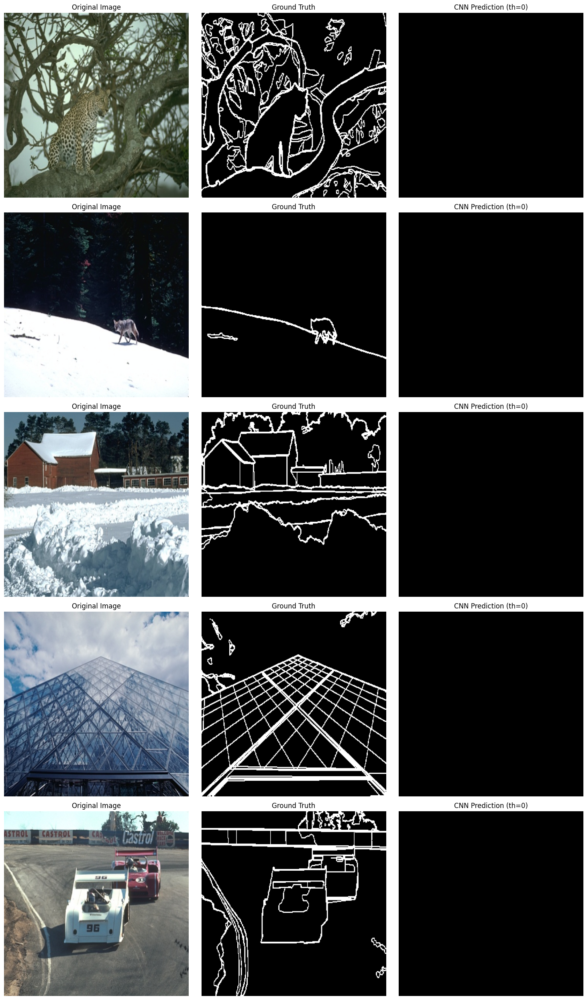

In [35]:
def visualize_results(model, dataloader, num_samples=5, threshold=0):
    model.eval()
    
    # Get some sample images
    dataiter = iter(dataloader)
    images, targets = next(dataiter)
    
    # Limit to requested number of samples
    images = images[:num_samples]
    targets = targets[:num_samples]
    
    # Generate predictions
    with torch.no_grad():
        outputs = model(images.to(device))
        binary_outputs = (outputs > 0).float()
    
    # Plot results
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 5*num_samples))

    for i in range(num_samples):
        # Original image
        img = images[i].cpu().permute(1, 2, 0).numpy()
        # Denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        
        # Ground truth
        gt = targets[i, 0].cpu().numpy()
        
        # Prediction
        pred = binary_outputs[i, 0].cpu().numpy()
        
        # Plot
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(gt, cmap='gray')
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(pred, cmap='gray')
        axes[i, 2].set_title(f'CNN Prediction (th={threshold})')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize results
visualize_results(final_model, val_loader)

In [36]:
best_params

{'lr': 0.003, 'wd': 0.0001}